# Fastai v1 : Object detection Tutorial

#### If you like, please don't forget to upvote

In [1]:
!pip install object-detection-fastai

  Created wheel for object-detection-fastai: filename=object_detection_fastai-0.0.6-py3-none-any.whl size=31578 sha256=b7cd99a0931faa76cfd157ca35372afe20330ee48d984d55121842661d5f1e71
  Stored in directory: /root/.cache/pip/wheels/1c/75/24/07b3216684aab3be20acdb86d1f9fcdf3ee57a307797d9b8a9
Successfully built object-detection-fastai
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [2]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from collections import defaultdict
import os
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.image as immg
from sklearn.model_selection import StratifiedKFold,KFold

from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric

In [3]:
sns.set_style('darkgrid')

In [4]:
path = Path('/kaggle/input/global-wheat-detection');path.ls()

[PosixPath('/kaggle/input/global-wheat-detection/test'),
 PosixPath('/kaggle/input/global-wheat-detection/sample_submission.csv'),
 PosixPath('/kaggle/input/global-wheat-detection/train.csv'),
 PosixPath('/kaggle/input/global-wheat-detection/train')]

In [5]:
train = pd.read_csv(path/'train.csv')

In [6]:
train.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [99]:
tr = train.image_id.value_counts()
tr = pd.DataFrame({'image_id':tr.index,'wheat_count':tr.values})
tr = tr.sample(frac=1.,random_state=2020).reset_index(drop=True)

In [127]:
tr.head()

,image_id,wheat_count
0,bcaa081f5,35
1,25fcffb8e,80
2,48fe9c634,71
3,af32eb10c,20
4,3eeed3eda,32


In [8]:
fnames = get_files(path/'train')

## DataFrame Format:

* A function needs to return the coordinates then the labels. 
* Let's look at an example quickly; from fastai before we preprocess the data

In [9]:
coco_source = untar_data(URLs.COCO_TINY)
images, lbl_bbox = get_annotations(coco_source/'train.json')
img2bbox = dict(zip(images, lbl_bbox))

In [10]:
images[0],lbl_bbox[0]

('000000542959.jpg',
 [[[86.34, 32.52, 95.75, 41.050000000000004],
   [110.52, 98.12, 114.59, 100.07000000000001],
   [51.62, 91.28, 57.339999999999996, 95.23],
   [110.82, 110.48, 126.03999999999999, 125.03],
   [50.18, 96.63, 63.64, 115.3],
   [111.73, 0.69, 124.79, 12.49]],
  ['chair', 'vase', 'vase', 'chair', 'chair', 'chair']])

* we have **images** and **labels**
* Then both get **ziped in a dictionary**

## fastai images label format for object detection

* Now we have our actual data frame above, we need to make some adjustments. 

* Currently our coordinates are **x, y , w , h** and we want **x1, y1, x2, y2**

* To convert it, we need to add our width and height to the respective x and y. 

* To achieve x2, y2 those we simply add **width to x** and **height to y** :---- **x2 = x + w** and **y2 = y + h**



* **dict contains image_names, bbox, label**

**format**

**{ 'dgdsf244.jpg' : [ [ [ bbox1 ][ bbox2] ] , 
                        [ 'label1' ,'label2' ] ]**


In [11]:
def get_lbl_img(train):
    wheat2bbox = {}
    train['label'] = 'wheat'
    grp = train.image_id.unique()
    tr_gr = train.groupby(['image_id'])
    from tqdm.notebook import tqdm
    for i in tqdm(range(len(grp))):
        name = str(grp[i]) + '.jpg'
        bbox = []
        temp_b = []
        temp = tr_gr.get_group(grp[i])
        tt = temp.loc[:,'bbox'].values
        for j in range(len(temp)):
            t = tt[j][1:-1].split(',')
            t = [float(x) for x in t]  # x,y, width, height
            # Currently our coordinates are x,y,w,h and we want x1,y1,x2,y2
            # To convert it, we need to add our width and height to the respective x and y.
            t[2],t[3] = t[0]+t[2],t[1]+t[3]  
            # To achieve x2,y2 those we simply add width to x and height to y :
            # x2 = x + w and y2 = y + h
            t1 = [t[1],t[0],t[3],t[2]]   # inverse in fromat w,h for fastai
            temp_b.append(t1)
        bbox.append(temp_b)
        bbox.append(['wheat']*len(temp))
        wheat2bbox[name] = bbox
    return wheat2bbox

In [12]:
wheat2bbox = get_lbl_img(train)

### Let's look at the dict of images and labels

In [13]:
a = wheat2bbox['d1f73158a.jpg'];a

[[[56.0, 143.0, 133.0, 348.0],
  [6.0, 46.0, 108.0, 163.0],
  [288.0, 253.0, 349.0, 415.0],
  [408.0, 350.0, 529.0, 422.0]],
 ['wheat', 'wheat', 'wheat', 'wheat']]

* Given a path below function will simply return its bbox and labels

In [14]:
get_y_func = lambda o: wheat2bbox[Path(o).name] 

### Now lets create a Object detection data block

In [15]:
sample = pd.read_csv('../input/global-wheat-detection/sample_submission.csv')

In [16]:
sample.head()

,image_id,PredictionString
0,aac893a91,1.0 0 0 50 50
1,51f1be19e,1.0 0 0 50 50
2,f5a1f0358,1.0 0 0 50 50
3,796707dd7,1.0 0 0 50 50
4,51b3e36ab,1.0 0 0 50 50


674.6

In [126]:
train_idx,valid_idx = np.arange(0,2698),np.arange(2698,3373)

In [17]:
image_id = sample.image_id.values

## DataBunch

In [18]:
ts = (ObjectItemList.from_df(sample,path, folder = 'test' , suffix = '.jpg',cols='image_id'))

In [128]:
data = (ObjectItemList.from_df(tr,path, folder = 'train' , suffix = '.jpg',cols='image_id')
        #Where are the images? ->
        .split_by_idxs(train_idx,valid_idx)                          
        #How to split in train/valid? -> randomly with the default 20% in valid
        .label_from_func(get_y_func)
        #How to find the labels? -> use get_y_func on the file name of the data
        .transform(size = 512)
        .add_test(ts)
        #Data augmentation? -> Standard transforms; also transform the label images
        .databunch(bs=4, collate_fn=bb_pad_collate))   

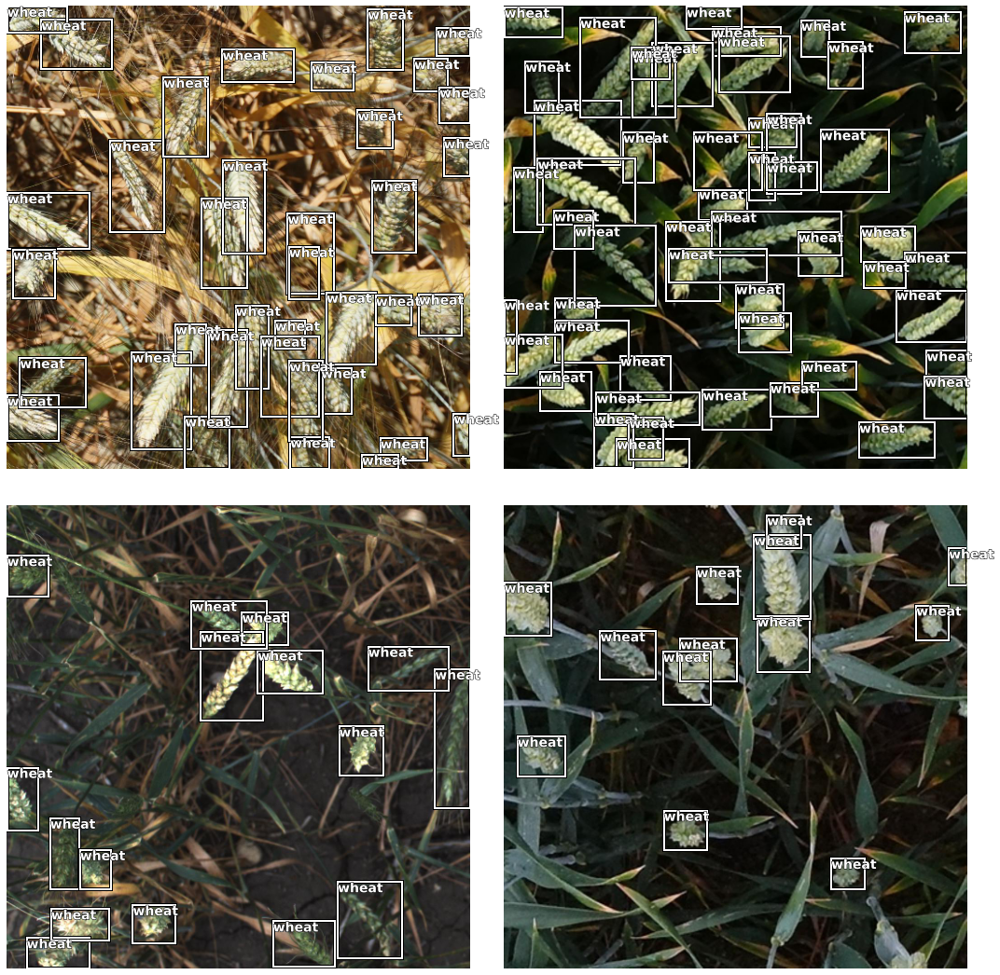

In [20]:
data.show_batch(2 , figsize = (15,15) )

In [21]:
len(data.train_ds),len(data.valid_ds),len(data.test_ds)

(2699, 674, 10)

In [22]:
data.classes

['background', 'wheat']

In [23]:
size = 512

### What Is an Anchor Box?
* **Anchor boxes are a set of predefined bounding boxes of a certain height and width. These boxes are defined to capture the scale and aspect ratio of specific object classes you want to detect** and are typically chosen based on object sizes in your training datasets. During detection, the predefined anchor boxes are tiled across the image. The network predicts the probability and other attributes, such as background, intersection over union (IoU) and offsets for every tiled anchor box. The predictions are used to refine each individual anchor box. You can define several anchor boxes, each for a different object size. Anchor boxes are fixed initial boundary box guesses.

* **The network does not directly predict bounding boxes, but rather predicts the probabilities and refinements that correspond to the tiled anchor boxes.** The network returns a unique set of predictions for every anchor box defined. The final feature map represents object detections for each class. The use of anchor boxes enables a network to detect multiple objects, objects of different scales, and overlapping objects.

### Advantage of Using Anchor Boxes
* When using anchor boxes, you can evaluate all object predictions at once. Anchor boxes eliminate the need to scan an image with a sliding window that computes a separate prediction at every potential position. 

In [24]:
anchors = create_anchors(sizes=[(32,32),(16,16),(8,8),(4,4)], ratios=[0.5, 1, 2], scales=[0.45, 0.55, 0.75, 0.95, 1.05, 1.15])

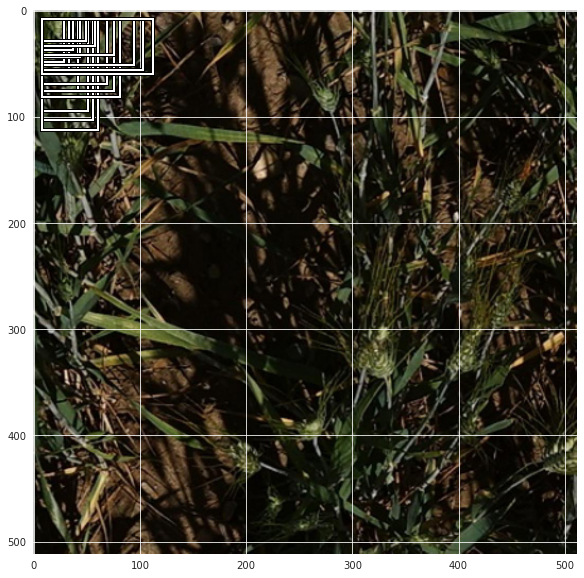

In [25]:
fig,ax = plt.subplots(figsize=(10,10))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:18]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

In [32]:
len(anchors)

24480

## Model Training

In [37]:
n_classes = data.train_ds.c

crit = RetinaNetFocalLoss(anchors)

encoder = create_body(models.resnet50, True, -2)

model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=18, sizes=[32,16,8,4], chs=32, final_bias = -4., n_conv = 2)

* **n_anchors = len(ratios) x len(scales)**

In [38]:
voc = PascalVOCMetric(anchors, size, [i for i in data.train_ds.y.classes[1:]])
learn = Learner(data, model, loss_func=crit,
                callback_fns=[BBMetrics],
                metrics=[voc],model_dir = '/kaggle/working/')

In [39]:
learn.split([model.encoder[6], model.c5top5]);
#learn.freeze_to(-2)

In [ ]:
learn.lr_find()
learn.recorder.plot()

In [30]:
gc.collect()

21985

In [ ]:
learn.unfreeze()
learn.fit_one_cycle(2, 1e-3 )

In [ ]:
learn.save('model_wheat')

In [41]:
learn.load('../input/fastai-v1-global-wheat-detection-tutorial/model_wheat');

In [ ]:
learn.recorder.plot_losses()

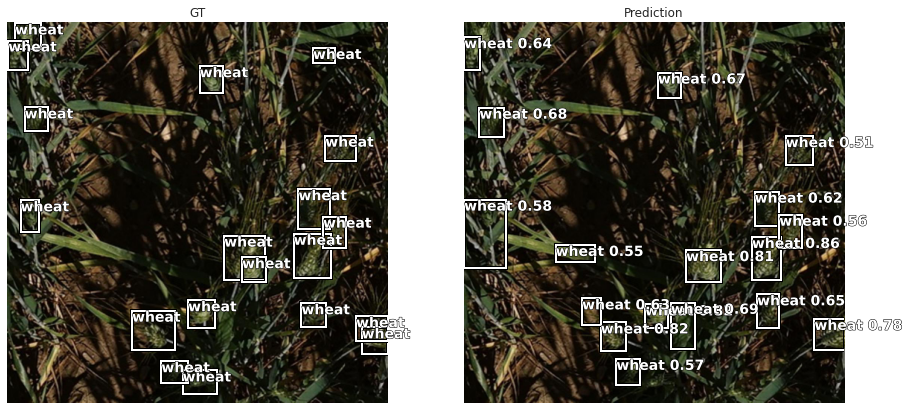

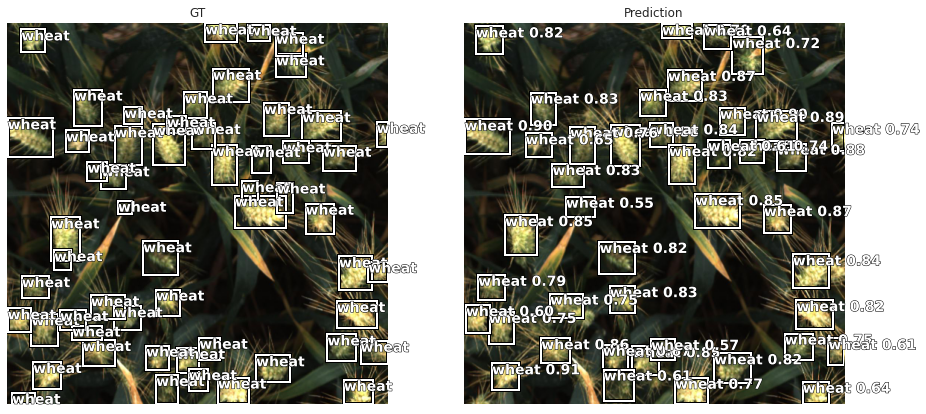

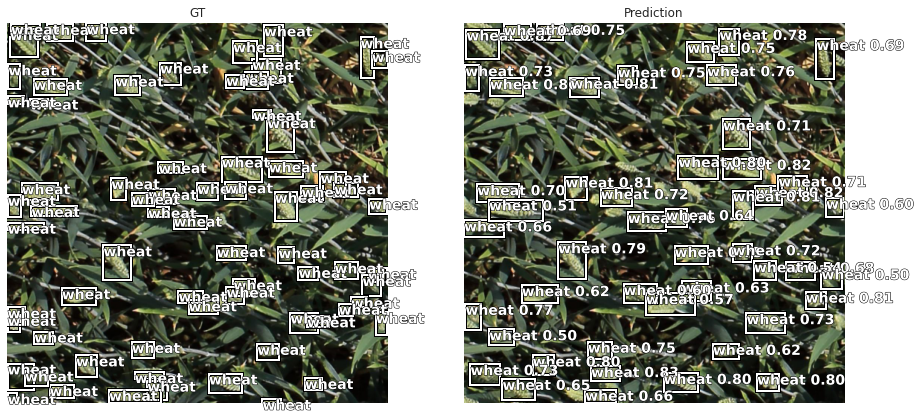

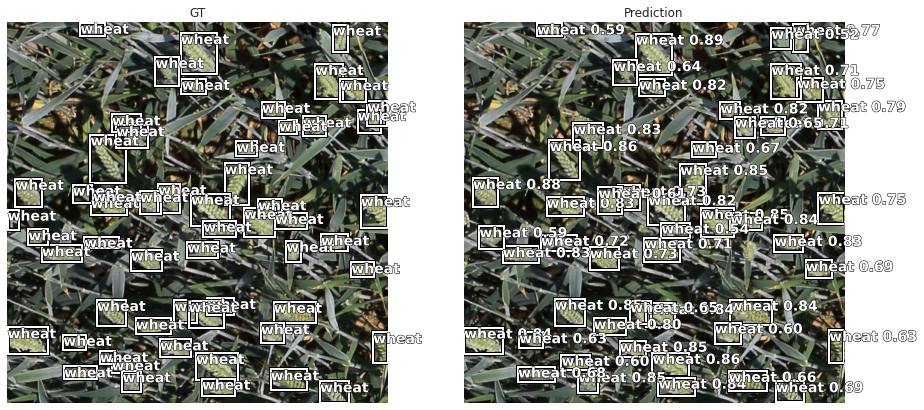

In [43]:
show_results_side_by_side(learn, anchors, detect_thresh=0.5, nms_thresh=0.1, image_count=5)

## If you reached till here please don't forget to upvote.

## Prediction Test images helpful functions

In [186]:
def show_output(item,bboxs_tot,scores_tot):
    fig,ax = plt.subplots(figsize=(8,8))
    ax.imshow(image2np(item.data))
    plt.axis('off')
    for bbox, c in zip(bboxs_tot[0], scores_tot[0].numpy()):
        txt = 'wheat, {}'.format(str(c)[:4])
        draw_rect(ax, [bbox[1],bbox[0],bbox[3],bbox[2]], text=txt,text_size=12)

In [187]:
def process_preds_show(item,clas,bboxs,show_img):
    detect_thresh=0.4   # set your own detection threshold
    nms_thresh=0.1
    scores_tot = []
    bboxs_tot = []
    for clas_pred, bbox_pred in list(zip(clas, bboxs)):
        bbox_pred, scores, preds = process_output(clas_pred, bbox_pred, anchors, detect_thresh)
        if bbox_pred is not None:
            to_keep = nms(bbox_pred, scores, nms_thresh)
            bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()
        t_sz = torch.Tensor([size])[None].cpu()
        if bbox_pred is not None:
            bbox_pred = to_np(rescale_boxes(bbox_pred, t_sz))
                # change from center to top left
            bbox_pred[:, :2] = bbox_pred[:, :2] - bbox_pred[:, 2:] / 2
            bboxs_tot.append(bbox_pred)
            scores_tot.append(scores)
    if show_img:
        show_output(item,bboxs_tot,scores_tot)
    return (bboxs_tot[0],scores_tot[0].numpy())

In [188]:
def get_prediction(show_img): # Set show img True to see img or else false for bboxs only
    preds_str = {}
    for i in range(len(data.test_ds)):
        item = learn.data.test_ds[i][0]  #Pick one image
        batch = learn.data.one_item(item)
        clas,bboxs,xtr = learn.pred_batch(batch=batch)
        prd = process_preds_show(item,clas,bboxs,show_img) 
        for j in range(len(prd[0])):
            bbx = prd[0][j]
            bbx = [bbx[1],bbx[0],bbx[3],bbx[2]]
            prd[0][j] = bbx
        preds_str[image_id[i]] = prd
    return preds_str

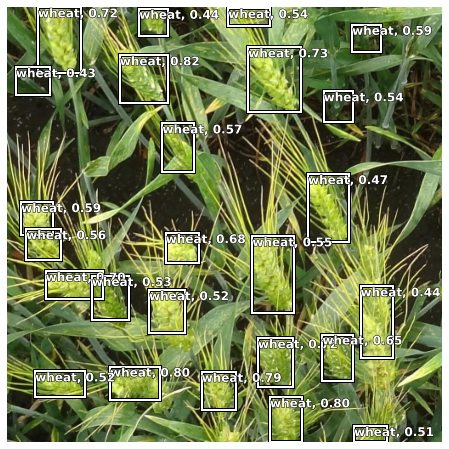

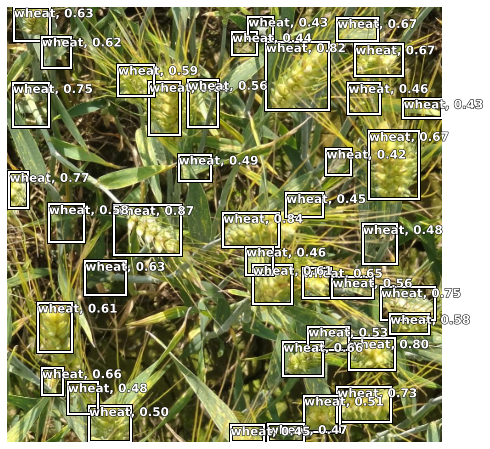

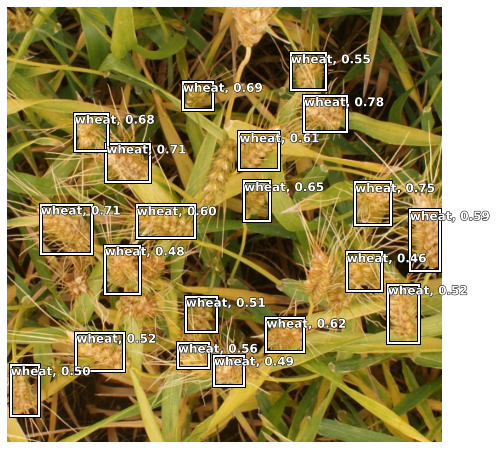

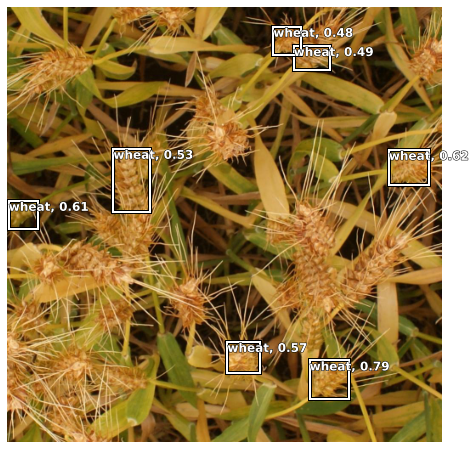

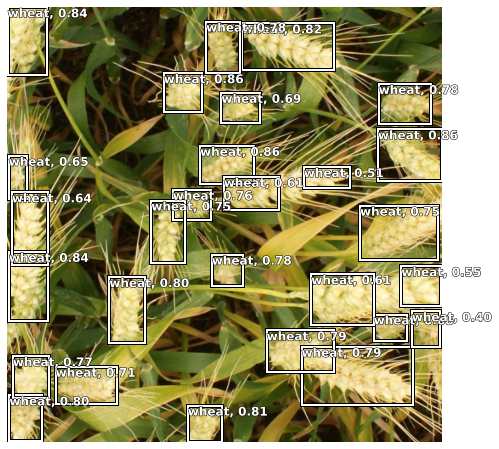

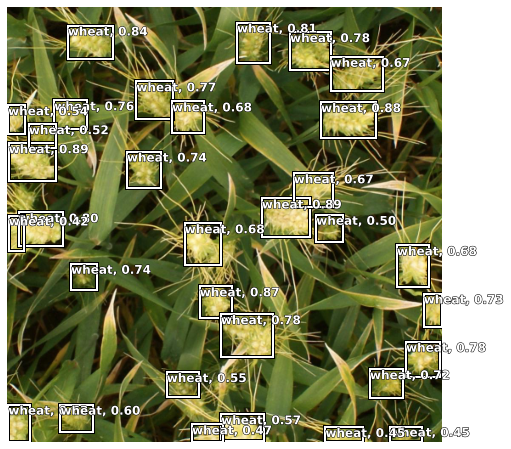

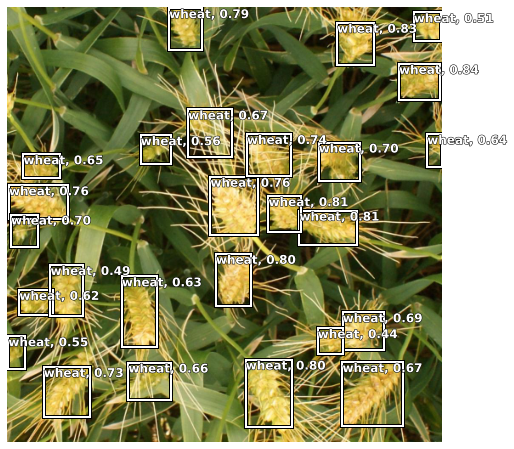

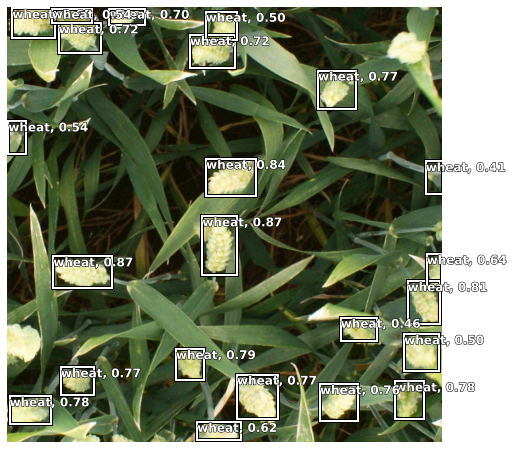

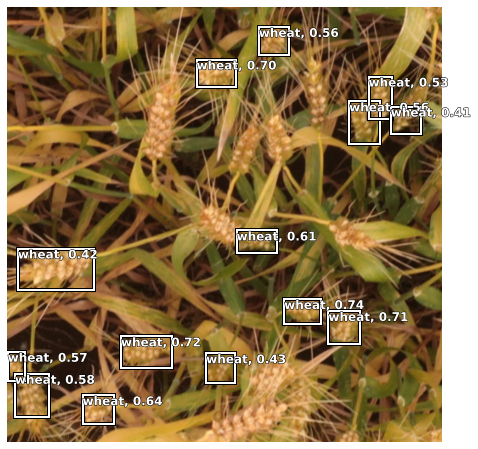

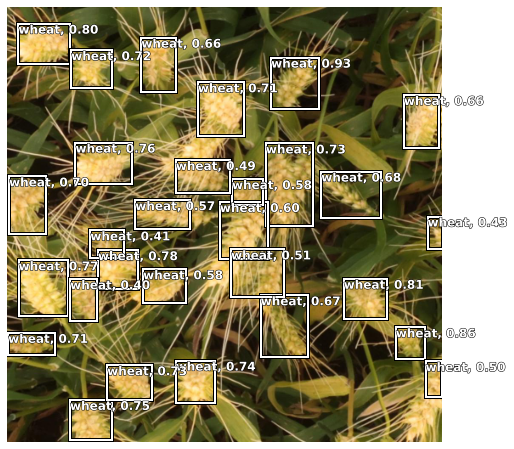

In [189]:
prediction = get_prediction(True)
# Set True for image_with predicton boxes or False for just prediction

In [193]:
idcode = sample.image_id.values

In [209]:
for s in idcode:
    a ,b = prediction[s][0]*2 , prediction[s][1]
    pred_str = ""
    for box,c in zip(a,b):
        pr_str = str(c) + " " + " ".join(str(x) for x in a[0]) + " "
        pred_str += pr_str
    sample.loc[:,'PredictionString'] = pred_str


In [210]:
sample

,image_id,PredictionString
0,aac893a91,0.93035996 620.46277 118.39584 111.630806 121....
1,51f1be19e,0.93035996 620.46277 118.39584 111.630806 121....
2,f5a1f0358,0.93035996 620.46277 118.39584 111.630806 121....
3,796707dd7,0.93035996 620.46277 118.39584 111.630806 121....
4,51b3e36ab,0.93035996 620.46277 118.39584 111.630806 121....
5,348a992bb,0.93035996 620.46277 118.39584 111.630806 121....
6,cc3532ff6,0.93035996 620.46277 118.39584 111.630806 121....
7,2fd875eaa,0.93035996 620.46277 118.39584 111.630806 121....
8,cb8d261a3,0.93035996 620.46277 118.39584 111.630806 121....
9,53f253011,0.93035996 620.46277 118.39584 111.630806 121....
